Для вашего проекта решите указанные задачи.

1) Используя табличные данные ДЗ №1, решите задачу регрессии с помощью нейронных сетей.

*   Рассмотрите минимум 3 архитектуры нейронной сети с минимум 3 разными параметрами модели и обучения.

*   Визуализируйте архитектуры моделей.

*   Постройте графики зависимости значений метрик и функции потерь от номера эпохи.

*   Выберите лучшую модель.

*   Настройте гиперпараметры модели и определите метрики работы модели при этих значениях.

*    Оцените качество работы модели на тестовых данных и оцените недообучение и переобучение.


2) Используя табличные данные ДЗ №1, повторите действия п.1, решив задачу классификации.

3) Возьмите датасет или изображений, или видео, или текстов, или звуковых/речевых данных, которые связаны с вашим проектом и нужны для решения задач проекта или создания нового умного функционала продукта/сервиса проекта.

*   Проведите обработку взятых данных с помощью нейронных сетей (аналогично предыдущим пунктам).

*   Выполните п.3, используя AutoKeras.


*Если ваш проект связан с рекомендательными системами или обучением с подкреплением, то можно адаптировать/изменить п.3 для решения такой задачи.


Описание проекта:

Будем работать с датасетом физической активности, которую собирает приложение о туристических маршрутах.

В этом датасете собраны данные 30 человек, выполняющих различные действия со смартфоном на поясе. Данные записывались с помощью датчиков (акселерометра и гироскопа) в этом смартфоне. Были зафиксированы: "3-осевое линейное ускорение" (tAcc-XYZ) и "3-осевая угловая скорость" (tGyro-XYZ).

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

In [ ]:
# Проверка на пропуски
print("Пропуски в тренировочном наборе данных:")
print(train.isnull().sum().sum())
print("\nПропуски в тестовом наборе данных:")
print(test.isnull().sum().sum())

Пропуски в тренировочном наборе данных:
0

Пропуски в тестовом наборе данных:
0


In [ ]:
# Проверка типов данных
print("\nТипы данных в тренировочном наборе:")
print(train.dtypes)
print("\nТипы данных в тестовом наборе:")
print(test.dtypes)


Типы данных в тренировочном наборе:
tBodyAcc-mean()-X       float64
tBodyAcc-mean()-Y       float64
tBodyAcc-mean()-Z       float64
tBodyAcc-std()-X        float64
tBodyAcc-std()-Y        float64
                         ...   
angle(X,gravityMean)    float64
angle(Y,gravityMean)    float64
angle(Z,gravityMean)    float64
subject                   int64
Activity                 object
Length: 563, dtype: object

Типы данных в тестовом наборе:
tBodyAcc-mean()-X       float64
tBodyAcc-mean()-Y       float64
tBodyAcc-mean()-Z       float64
tBodyAcc-std()-X        float64
tBodyAcc-std()-Y        float64
                         ...   
angle(X,gravityMean)    float64
angle(Y,gravityMean)    float64
angle(Z,gravityMean)    float64
subject                   int64
Activity                 object
Length: 563, dtype: object


In [ ]:
# Проверка на дубликаты
print("\nДубликаты в тренировочном наборе:")
print(train.duplicated().sum())
print("\nДубликаты в тестовом наборе:")
print(test.duplicated().sum())


Дубликаты в тренировочном наборе:
0

Дубликаты в тестовом наборе:
0


In [ ]:
# Проверка статистических данных
print("\nОписательная статистика тренировочного набора:")
print(train.describe())
print("\nОписательная статистика тестового набора:")
print(test.describe())


Описательная статистика тренировочного набора:
       tBodyAcc-mean()-X  tBodyAcc-mean()-Y  tBodyAcc-mean()-Z  \
count        7352.000000        7352.000000        7352.000000   
mean            0.274488          -0.017695          -0.109141   
std             0.070261           0.040811           0.056635   
min            -1.000000          -1.000000          -1.000000   
25%             0.262975          -0.024863          -0.120993   
50%             0.277193          -0.017219          -0.108676   
75%             0.288461          -0.010783          -0.097794   
max             1.000000           1.000000           1.000000   

       tBodyAcc-std()-X  tBodyAcc-std()-Y  tBodyAcc-std()-Z  tBodyAcc-mad()-X  \
count       7352.000000       7352.000000       7352.000000       7352.000000   
mean          -0.605438         -0.510938         -0.604754         -0.630512   
std            0.448734          0.502645          0.418687          0.424073   
min           -1.000000         -

In [ ]:
train.head()

,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,tBodyAcc-mad()-Z,tBodyAcc-max()-X,...,fBodyBodyGyroJerkMag-kurtosis(),"angle(tBodyAccMean,gravity)","angle(tBodyAccJerkMean),gravityMean)","angle(tBodyGyroMean,gravityMean)","angle(tBodyGyroJerkMean,gravityMean)","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",subject,Activity
0,0.288585,-0.020294,-0.132905,-0.995279,-0.983111,-0.913526,-0.995112,-0.983185,-0.923527,-0.934724,...,-0.710304,-0.112754,0.030400,-0.464761,-0.018446,-0.841247,0.179941,-0.058627,1,STANDING
1,0.278419,-0.016411,-0.123520,-0.998245,-0.975300,-0.960322,-0.998807,-0.974914,-0.957686,-0.943068,...,-0.861499,0.053477,-0.007435,-0.732626,0.703511,-0.844788,0.180289,-0.054317,1,STANDING
2,0.279653,-0.019467,-0.113462,-0.995380,-0.967187,-0.978944,-0.996520,-0.963668,-0.977469,-0.938692,...,-0.760104,-0.118559,0.177899,0.100699,0.808529,-0.848933,0.180637,-0.049118,1,STANDING
3,0.279174,-0.026201,-0.123283,-0.996091,-0.983403,-0.990675,-0.997099,-0.982750,-0.989302,-0.938692,...,-0.482845,-0.036788,-0.012892,0.640011,-0.485366,-0.848649,0.181935,-0.047663,1,STANDING
4,0.276629,-0.016570,-0.115362,-0.998139,-0.980817,-0.990482,-0.998321,-0.979672,-0.990441,-0.942469,...,-0.699205,0.123320,0.122542,0.693578,-0.615971,-0.847865,0.185151,-0.043892,1,STANDING


In [ ]:
test.head()

,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,tBodyAcc-mad()-Z,tBodyAcc-max()-X,...,fBodyBodyGyroJerkMag-kurtosis(),"angle(tBodyAccMean,gravity)","angle(tBodyAccJerkMean),gravityMean)","angle(tBodyGyroMean,gravityMean)","angle(tBodyGyroJerkMean,gravityMean)","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",subject,Activity
0,0.257178,-0.023285,-0.014654,-0.938404,-0.920091,-0.667683,-0.952501,-0.925249,-0.674302,-0.894088,...,-0.705974,0.006462,0.162920,-0.825886,0.271151,-0.720009,0.276801,-0.057978,2,STANDING
1,0.286027,-0.013163,-0.119083,-0.975415,-0.967458,-0.944958,-0.986799,-0.968401,-0.945823,-0.894088,...,-0.594944,-0.083495,0.017500,-0.434375,0.920593,-0.698091,0.281343,-0.083898,2,STANDING
2,0.275485,-0.026050,-0.118152,-0.993819,-0.969926,-0.962748,-0.994403,-0.970735,-0.963483,-0.939260,...,-0.640736,-0.034956,0.202302,0.064103,0.145068,-0.702771,0.280083,-0.079346,2,STANDING
3,0.270298,-0.032614,-0.117520,-0.994743,-0.973268,-0.967091,-0.995274,-0.974471,-0.968897,-0.938610,...,-0.736124,-0.017067,0.154438,0.340134,0.296407,-0.698954,0.284114,-0.077108,2,STANDING
4,0.274833,-0.027848,-0.129527,-0.993852,-0.967445,-0.978295,-0.994111,-0.965953,-0.977346,-0.938610,...,-0.846595,-0.002223,-0.040046,0.736715,-0.118545,-0.692245,0.290722,-0.073857,2,STANDING


In [ ]:
# Вывод всех признаков тренировочного набора данных
print("Признаки тренировочного набора данных:")
int(train.columns.tolist())

# Вывод всех признаков тестового набора данных
print("\nПризнаки тестового набора данных:")
print(test.columns.tolist())

Признаки тренировочного набора данных:
['tBodyAcc-mean()-X', 'tBodyAcc-mean()-Y', 'tBodyAcc-mean()-Z', 'tBodyAcc-std()-X', 'tBodyAcc-std()-Y', 'tBodyAcc-std()-Z', 'tBodyAcc-mad()-X', 'tBodyAcc-mad()-Y', 'tBodyAcc-mad()-Z', 'tBodyAcc-max()-X', 'tBodyAcc-max()-Y', 'tBodyAcc-max()-Z', 'tBodyAcc-min()-X', 'tBodyAcc-min()-Y', 'tBodyAcc-min()-Z', 'tBodyAcc-sma()', 'tBodyAcc-energy()-X', 'tBodyAcc-energy()-Y', 'tBodyAcc-energy()-Z', 'tBodyAcc-iqr()-X', 'tBodyAcc-iqr()-Y', 'tBodyAcc-iqr()-Z', 'tBodyAcc-entropy()-X', 'tBodyAcc-entropy()-Y', 'tBodyAcc-entropy()-Z', 'tBodyAcc-arCoeff()-X,1', 'tBodyAcc-arCoeff()-X,2', 'tBodyAcc-arCoeff()-X,3', 'tBodyAcc-arCoeff()-X,4', 'tBodyAcc-arCoeff()-Y,1', 'tBodyAcc-arCoeff()-Y,2', 'tBodyAcc-arCoeff()-Y,3', 'tBodyAcc-arCoeff()-Y,4', 'tBodyAcc-arCoeff()-Z,1', 'tBodyAcc-arCoeff()-Z,2', 'tBodyAcc-arCoeff()-Z,3', 'tBodyAcc-arCoeff()-Z,4', 'tBodyAcc-correlation()-X,Y', 'tBodyAcc-correlation()-X,Z', 'tBodyAcc-correlation()-Y,Z', 'tGravityAcc-mean()-X', 'tGravityAcc

# 1) Задача регрессии с помощью нейронных сетей

Архитектура 1: Простая полносвязная сеть

 За целевую переменную возьмем например tBodyAcc-max()-X

In [ ]:
from keras.models import Sequential
from keras.layers import Dense

In [ ]:
y_train = train["tBodyAcc-max()-X"]
y_test = test["tBodyAcc-max()-X"]

In [ ]:
X_train = train[["tBodyAccMag-mean()","tBodyGyroJerk-mad()-X","tGravityAcc-min()-X","fBodyAcc-bandsEnergy()-1,8.2","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)","fBodyAcc-skewness()-X"]]
X_test = test[["tBodyAccMag-mean()","tBodyGyroJerk-mad()-X","tGravityAcc-min()-X","fBodyAcc-bandsEnergy()-1,8.2","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)","fBodyAcc-skewness()-X"]]

In [ ]:
# Архитектура модели
model_1 = Sequential()
model_1.add(Dense(64, input_dim=X_train.shape[1], activation='relu'))
model_1.add(Dense(1, activation='linear'))

# Компиляция модели
model_1.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])

# Обучение модели
history_1 = model_1.fit(X_train, y_train, epochs=100, batch_size=32, validation_split=0.2, verbose=0)

In [ ]:
# Оценка модели
eval_result = model_1.evaluate(X_test, y_test)
print("[test loss, test mae]:", eval_result)

93/93 [==============================] - 0s 2ms/step - loss: 0.0189 - mae: 0.0803
[test loss, test mae]: [0.018851246684789658, 0.08025195449590683]


Архитектура 2: Глубокая полносвязная сеть

In [ ]:
# Архитектура модели
model_2 = Sequential()
model_2.add(Dense(128, input_dim=X_train.shape[1], activation='relu'))
model_2.add(Dense(64, activation='relu'))
model_2.add(Dense(64, activation='relu'))
model_2.add(Dense(64, activation='relu'))
model_2.add(Dense(64, activation='relu'))
model_2.add(Dense(32, activation='relu'))
model_2.add(Dense(1, activation='linear'))

# Компиляция модели
model_2.compile(optimizer='sgd', loss='mean_squared_error', metrics=['mae'])

# Обучение модели
history_2 = model_2.fit(X_train, y_train, epochs=100, batch_size=64, validation_split=0.2, verbose=0)


In [ ]:
# Оценка модели
eval_result = model_2.evaluate(X_test, y_test)
print("[test loss, test mae]:", eval_result)

93/93 [==============================] - 0s 3ms/step - loss: 0.0147 - mae: 0.0739
[test loss, test mae]: [0.01474537793546915, 0.07393579185009003]


Архитектура 3: Сеть с регуляризацией

In [ ]:
from keras.layers import Dropout
from keras.regularizers import l2

# Архитектура модели
model_3 = Sequential()
model_3.add(Dense(64, input_dim=X_train.shape[1], activation='relu', kernel_regularizer=l2(0.01)))
model_3.add(Dropout(0.5))
model_3.add(Dense(32, activation='relu', kernel_regularizer=l2(0.01)))
model_3.add(Dropout(0.5))
model_3.add(Dense(1, activation='linear'))

# Компиляция модели
model_3.compile(optimizer='rmsprop', loss='mean_squared_error', metrics=['mae'])

# Обучение модели
history_3 = model_3.fit(X_train, y_train, epochs=100, batch_size=32, validation_split=0.2, verbose=0)


In [ ]:
# Оценка модели
eval_result = model_3.evaluate(X_test, y_test)
print("[test loss, test mae]:", eval_result)

93/93 [==============================] - 0s 2ms/step - loss: 0.0293 - mae: 0.1102
[test loss, test mae]: [0.029261024668812752, 0.1101958230137825]


Визуализация архитектур моделей

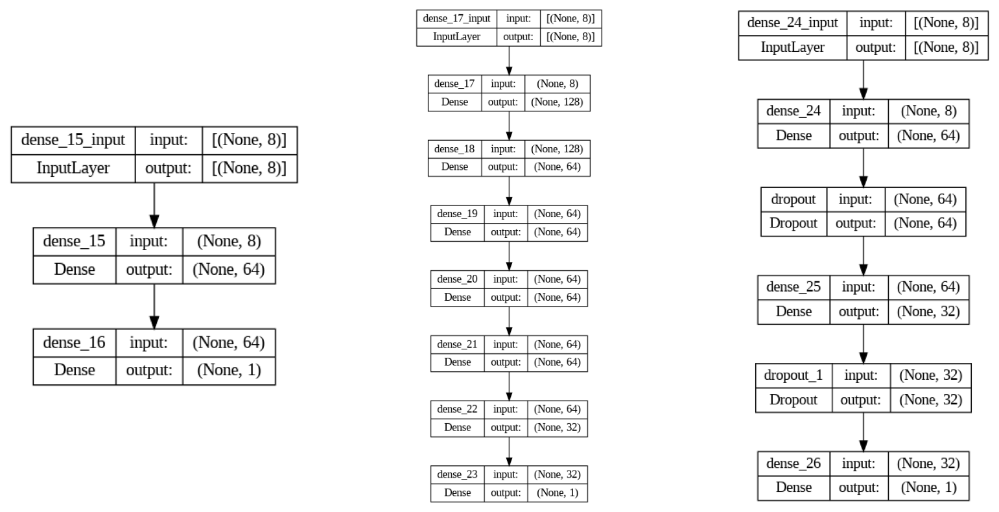

In [ ]:
from tensorflow.keras.utils import plot_model
from IPython.display import Image
import matplotlib.image as mpimg

# Сохранение визуализаций архитектур моделей в файлы
plot_model(model_1, to_file='model_1.png', show_shapes=True, show_layer_names=True)
plot_model(model_2, to_file='model_2.png', show_shapes=True, show_layer_names=True)
plot_model(model_3, to_file='model_3.png', show_shapes=True, show_layer_names=True)

# Отображение изображений архитектур моделей на одном plot
fig, axs = plt.subplots(1, 3, figsize=(20, 10))

# Отображение модели 1
img_1 = mpimg.imread('model_1.png')
axs[0].imshow(img_1)
axs[0].axis('off')  # Скрыть оси

# Отображение модели 2
img_2 = mpimg.imread('model_2.png')
axs[1].imshow(img_2)
axs[1].axis('off')

# Отображение модели 3
img_3 = mpimg.imread('model_3.png')
axs[2].imshow(img_3)
axs[2].axis('off')

plt.show()



Визуализация метрик и функции потерь

Для построения графиков зависимости метрик и функции потерь от номера эпохи

In [ ]:
def plot_all_metrics(histories, metric_names):
    fig, axes = plt.subplots(nrows=len(metric_names), ncols=len(histories), figsize=(15, 10))

    for col, (model_name, history) in enumerate(histories.items()):
        for row, metric_name in enumerate(metric_names):
            axes[row, col].plot(history.history[metric_name], label=f'Train {metric_name}')
            axes[row, col].plot(history.history[f'val_{metric_name}'], label=f'Validation {metric_name}')
            axes[row, col].set_title(f'{model_name} - {metric_name}')
            axes[row, col].set_xlabel('Epochs')
            axes[row, col].set_ylabel(metric_name)
            axes[row, col].legend()

    plt.tight_layout()
    plt.show()

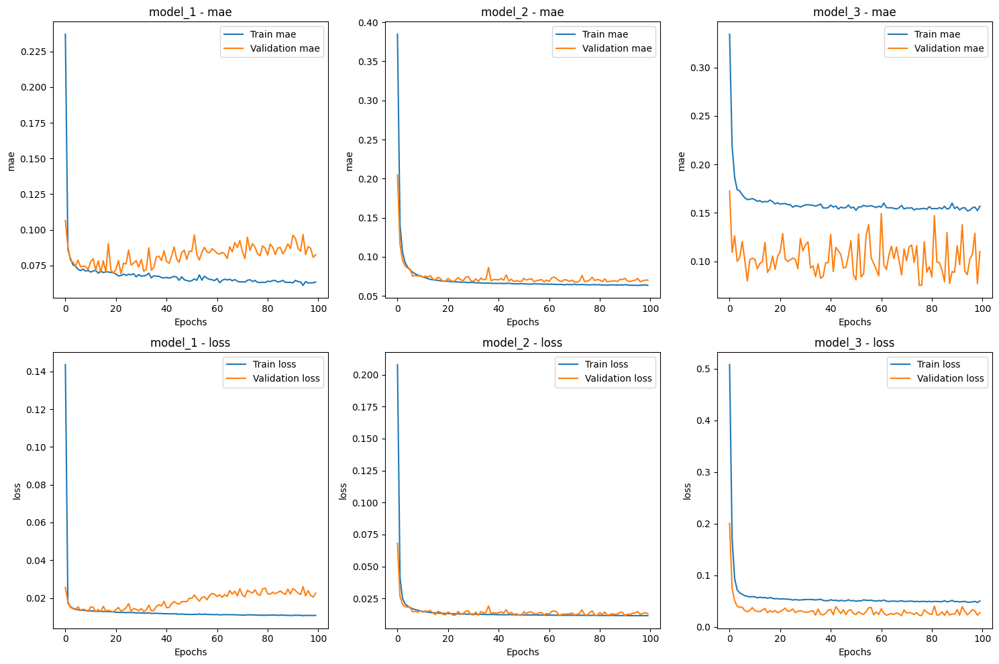

In [ ]:
histories = {
    'model_1': history_1,
    'model_2': history_2,
    'model_3': history_3
}

# Метрики, которые вы хотите визуализировать
metric_names = ['mae', 'loss']

# Вызов функции для визуализации
plot_all_metrics(histories, metric_names)

In [ ]:
!pip install keras-tuner --upgrade

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 2.7 MB/s eta 0:00:00


In [ ]:
import kerastuner as kt
from keras.models import Sequential
from keras.layers import Dense
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

def build_model(hp):
    model = Sequential()
    model.add(Dense(units=hp.Int('units', min_value=32, max_value=512, step=32),
                    activation=hp.Choice('activation', values=['relu', 'tanh', 'sigmoid']),
                    input_dim=X_train.shape[1]))
    for i in range(hp.Int('num_layers', 1, 3)):
        model.add(Dense(units=hp.Int(f'units_{i}', min_value=32, max_value=512, step=32),
                        activation=hp.Choice(f'activation_{i}', values=['relu', 'tanh', 'sigmoid'])))
    model.add(Dense(1, activation='linear'))
    model.compile(
        optimizer=hp.Choice('optimizer', values=['adam', 'sgd', 'rmsprop']),
        loss='mean_squared_error',
        metrics=['mae']
    )
    return model

tuner = kt.Hyperband(
    build_model,
    objective='val_mae',
    max_epochs=10,
    hyperband_iterations=2,
    directory='my_dir',
    project_name='keras_tuner_demo'
)

# Поиск гиперпараметров
tuner.search(X_train, y_train, epochs=50, validation_split=0.2, verbose=1)

# Получение оптимальных гиперпараметров
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
print(f"Лучшие гиперпараметры: {best_hps.values}")


Reloading Tuner from my_dir/keras_tuner_demo/tuner0.json
Лучшие гиперпараметры: {'units': 256, 'activation': 'tanh', 'num_layers': 3, 'units_0': 416, 'activation_0': 'tanh', 'optimizer': 'rmsprop', 'units_1': 448, 'activation_1': 'sigmoid', 'units_2': 32, 'activation_2': 'tanh', 'tuner/epochs': 10, 'tuner/initial_epoch': 4, 'tuner/bracket': 2, 'tuner/round': 2, 'tuner/trial_id': '0014'}


In [ ]:
# Обучение модели с оптимальными гиперпараметрами
model = tuner.hypermodel.build(best_hps)
history = model.fit(X_train, y_train, epochs=50, validation_split=0.2, verbose=0)

# Оценка лучшей модели
eval_result = model.evaluate(X_test, y_test)
print("[test loss, test mae]:", eval_result)

93/93 [==============================] - 0s 3ms/step - loss: 0.0156 - mae: 0.0764
[test loss, test mae]: [0.015587517991662025, 0.0763791874051094]


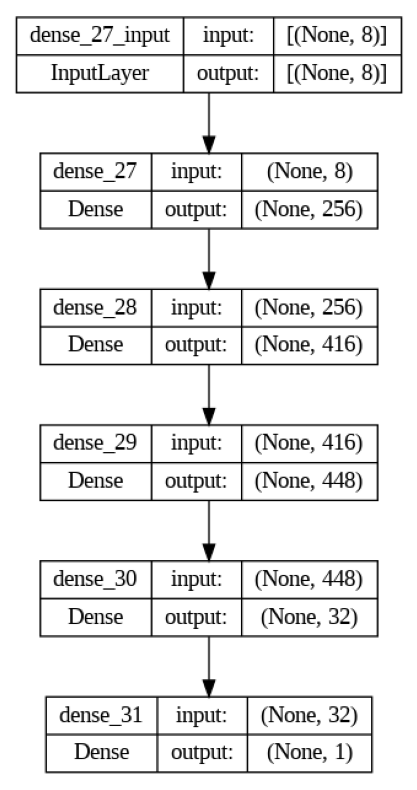

In [ ]:
# Сохранение визуализации архитектуры модели в файл
plot_model(model, to_file='model_best.png', show_shapes=True, show_layer_names=True)

# Отображение изображения архитектуры модели
img = mpimg.imread('model_best.png')
plt.figure(figsize=(10, 10))
plt.imshow(img)
plt.axis('off')  # Скрыть оси
plt.show()


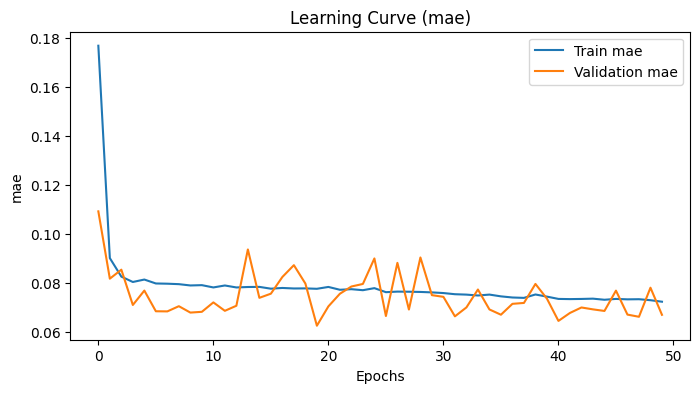

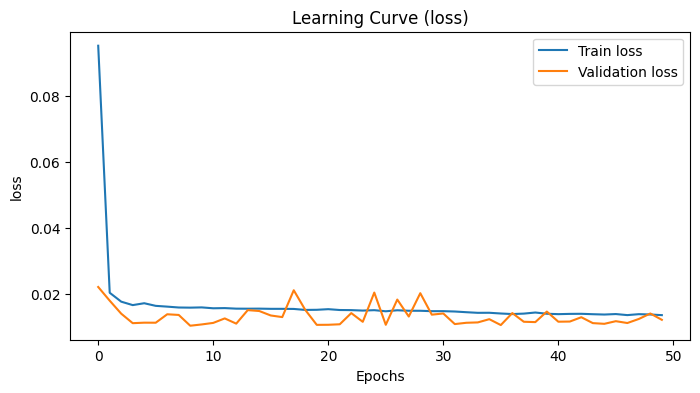

In [ ]:
import matplotlib.pyplot as plt

def plot_learning_curve(history, metric):
    plt.figure(figsize=(8, 4))
    plt.plot(history.history[metric], label=f'Train {metric}')
    plt.plot(history.history[f'val_{metric}'], label=f'Validation {metric}')
    plt.title(f'Learning Curve ({metric})')
    plt.xlabel('Epochs')
    plt.ylabel(metric)
    plt.legend()
    plt.show()


plot_learning_curve(history, 'mae')
plot_learning_curve(history, 'loss')



# 2) Задача классификации с помощью нейронных сетей

In [ ]:
from keras.models import Sequential
from keras.layers import Dense, Dropout
from keras.optimizers import Adam

In [ ]:
X_train = train[["tBodyAcc-max()-X","tBodyAccMag-mean()","tBodyGyroJerk-mad()-X","tGravityAcc-min()-X","fBodyAcc-bandsEnergy()-1,8.2","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)","fBodyAcc-skewness()-X"]]
X_test = test[["tBodyAcc-max()-X","tBodyAccMag-mean()","tBodyGyroJerk-mad()-X","tGravityAcc-min()-X","fBodyAcc-bandsEnergy()-1,8.2","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)","fBodyAcc-skewness()-X"]]

y_train = train["Activity"]
y_test = test["Activity"]

In [ ]:
from sklearn.preprocessing import LabelEncoder
from keras.utils import to_categorical
# Создание экземпляра LabelEncoder
label_encoder = LabelEncoder()

# Обучение энкодера и преобразование меток
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)

# Теперь преобразование числовых меток в категориальный формат
y_train_categorical = to_categorical(y_train_encoded)
y_test_categorical = to_categorical(y_test_encoded)


In [ ]:
# Архитектура 1: Простая полносвязная сеть
model_1 = Sequential([
    Dense(64, input_shape=(X_train.shape[1],), activation='relu'),
    Dense(64, activation='relu'),
    Dense(y_train_categorical.shape[1], activation='softmax')
])
model_1.compile(optimizer=Adam(lr=0.001), loss='categorical_crossentropy', metrics=['accuracy'])
history_1 = model_1.fit(X_train, y_train_categorical, epochs=30, batch_size=32, validation_split=0.2)

Epoch 1/30
184/184 [==============================] - 4s 11ms/step - loss: 0.8929 - accuracy: 0.6854 - val_loss: 0.4422 - val_accuracy: 0.8872
Epoch 2/30
184/184 [==============================] - 2s 11ms/step - loss: 0.4231 - accuracy: 0.8340 - val_loss: 0.3305 - val_accuracy: 0.9014
Epoch 3/30
184/184 [==============================] - 2s 9ms/step - loss: 0.3318 - accuracy: 0.8594 - val_loss: 0.3382 - val_accuracy: 0.8606
Epoch 4/30
184/184 [==============================] - 1s 5ms/step - loss: 0.2896 - accuracy: 0.8781 - val_loss: 0.3191 - val_accuracy: 0.8865
Epoch 5/30
184/184 [==============================] - 1s 5ms/step - loss: 0.2664 - accuracy: 0.8888 - val_loss: 0.3359 - val_accuracy: 0.8851
Epoch 6/30
184/184 [==============================] - 1s 5ms/step - loss: 0.2545 - accuracy: 0.8896 - val_loss: 0.3247 - val_accuracy: 0.8831
Epoch 7/30
184/184 [==============================] - 1s 5ms/step - loss: 0.2472 - accuracy: 0.8953 - val_loss: 0.3153 - val_accuracy: 0.8912
Epoc

In [ ]:
# Архитектура 2: Полносвязная сеть с Dropout
model_2 = Sequential([
    Dense(128, input_shape=(X_train.shape[1],), activation='relu'),
    Dropout(0.5),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(y_train_categorical.shape[1], activation='softmax')
])
model_2.compile(optimizer=Adam(lr=0.0005), loss='categorical_crossentropy', metrics=['accuracy'])
history_2 = model_2.fit(X_train, y_train_categorical, epochs=30, batch_size=64, validation_split=0.2)


Epoch 1/30
92/92 [==============================] - 1s 6ms/step - loss: 1.1251 - accuracy: 0.5322 - val_loss: 0.5898 - val_accuracy: 0.8736
Epoch 2/30
92/92 [==============================] - 0s 4ms/step - loss: 0.6755 - accuracy: 0.6970 - val_loss: 0.4415 - val_accuracy: 0.8804
Epoch 3/30
92/92 [==============================] - 0s 4ms/step - loss: 0.5533 - accuracy: 0.7613 - val_loss: 0.3627 - val_accuracy: 0.9028
Epoch 4/30
92/92 [==============================] - 0s 5ms/step - loss: 0.4909 - accuracy: 0.7909 - val_loss: 0.3336 - val_accuracy: 0.8939
Epoch 5/30
92/92 [==============================] - 0s 4ms/step - loss: 0.4455 - accuracy: 0.8121 - val_loss: 0.3232 - val_accuracy: 0.8865
Epoch 6/30
92/92 [==============================] - 0s 4ms/step - loss: 0.4025 - accuracy: 0.8332 - val_loss: 0.3191 - val_accuracy: 0.8810
Epoch 7/30
92/92 [==============================] - 0s 4ms/step - loss: 0.3779 - accuracy: 0.8371 - val_loss: 0.3087 - val_accuracy: 0.8804
Epoch 8/30
92/92 [==

In [ ]:
# Архитектура 3: Глубокая полносвязная сеть
model_3 = Sequential([
    Dense(256, input_shape=(X_train.shape[1],), activation='relu'),
    Dense(256, activation='relu'),
    Dense(256, activation='relu'),
    Dense(256, activation='relu'),
    Dense(256, activation='relu'),
    Dense(256, activation='relu'),
    Dense(y_train_categorical.shape[1], activation='softmax')
])
model_3.compile(optimizer=Adam(lr=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])
history_3 = model_3.fit(X_train, y_train_categorical, epochs=30, batch_size=128, validation_split=0.2)


Epoch 1/30
46/46 [==============================] - 2s 21ms/step - loss: 0.7686 - accuracy: 0.6910 - val_loss: 0.3338 - val_accuracy: 0.8892
Epoch 2/30
46/46 [==============================] - 1s 16ms/step - loss: 0.3431 - accuracy: 0.8485 - val_loss: 0.4094 - val_accuracy: 0.8559
Epoch 3/30
46/46 [==============================] - 1s 16ms/step - loss: 0.2748 - accuracy: 0.8845 - val_loss: 0.3307 - val_accuracy: 0.8851
Epoch 4/30
46/46 [==============================] - 1s 14ms/step - loss: 0.2477 - accuracy: 0.8908 - val_loss: 0.3162 - val_accuracy: 0.8858
Epoch 5/30
46/46 [==============================] - 1s 16ms/step - loss: 0.2247 - accuracy: 0.9078 - val_loss: 0.2970 - val_accuracy: 0.8980
Epoch 6/30
46/46 [==============================] - 1s 16ms/step - loss: 0.2114 - accuracy: 0.9114 - val_loss: 0.3116 - val_accuracy: 0.8824
Epoch 7/30
46/46 [==============================] - 1s 21ms/step - loss: 0.2126 - accuracy: 0.9097 - val_loss: 0.3118 - val_accuracy: 0.8783
Epoch 8/30
46

In [ ]:
# Оценка моделей
score_1 = model_1.evaluate(X_test, y_test_categorical, verbose=1)
score_2 = model_2.evaluate(X_test, y_test_categorical, verbose=1)
score_3 = model_3.evaluate(X_test, y_test_categorical, verbose=1)

print(f'Модель 1 - Точность: {score_1[1]:.4f}')
print(f'Модель 2 - Точность: {score_2[1]:.4f}')
print(f'Модель 3 - Точность: {score_3[1]:.4f}')

93/93 [==============================] - 1s 6ms/step - loss: 1.2838 - accuracy: 0.8056
Модель 1 - Точность: 0.8208
Модель 2 - Точность: 0.8347
Модель 3 - Точность: 0.8056


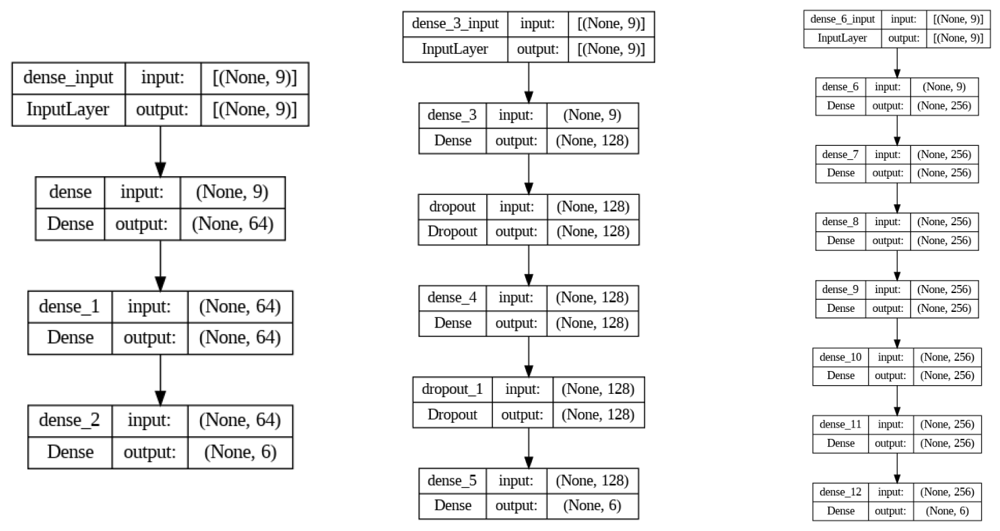

In [ ]:
from tensorflow.keras.utils import plot_model
from IPython.display import Image
import matplotlib.image as mpimg

# Сохранение визуализаций архитектур моделей в файлы
plot_model(model_1, to_file='model_1_cl.png', show_shapes=True, show_layer_names=True)
plot_model(model_2, to_file='model_2_cl.png', show_shapes=True, show_layer_names=True)
plot_model(model_3, to_file='model_3_cl.png', show_shapes=True, show_layer_names=True)

# Отображение изображений архитектур моделей на одном plot
fig, axs = plt.subplots(1, 3, figsize=(20, 10))

# Отображение модели 1
img_1 = mpimg.imread('model_1_cl.png')
axs[0].imshow(img_1)
axs[0].axis('off')  # Скрыть оси

# Отображение модели 2
img_2 = mpimg.imread('model_2_cl.png')
axs[1].imshow(img_2)
axs[1].axis('off')

# Отображение модели 3
img_3 = mpimg.imread('model_3_cl.png')
axs[2].imshow(img_3)
axs[2].axis('off')

plt.show()



In [ ]:
def plot_history(history, name, key='accuracy'):
    plt.figure(figsize=(15, 5))

    val = plt.plot(history.epoch, history.history['val_'+key],
                   '--', label=name.title()+' Val')
    plt.plot(history.epoch, history.history[key], color=val[0].get_color(),
             label=name.title()+' Train')

    plt.title(f'Модель {name} - {key.replace("_", " ").title()}')
    plt.xlabel('Эпоха')
    plt.ylabel(key.replace('_', ' ').title())
    plt.legend()
    plt.xlim([0, max(history.epoch)])
    plt.show()

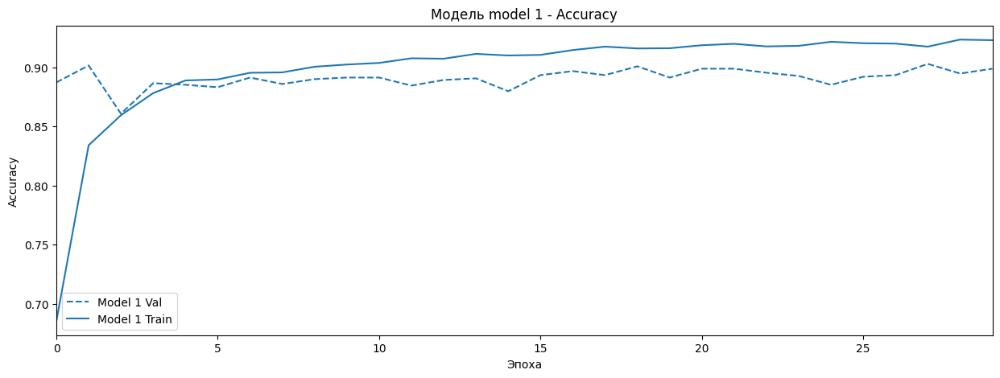

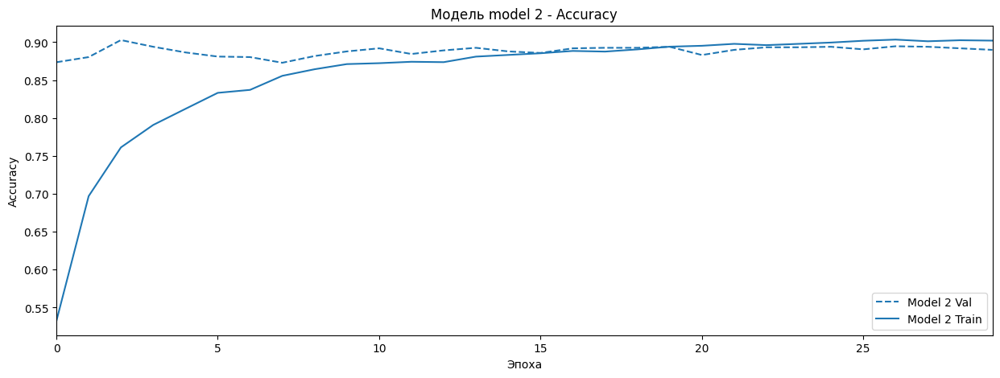

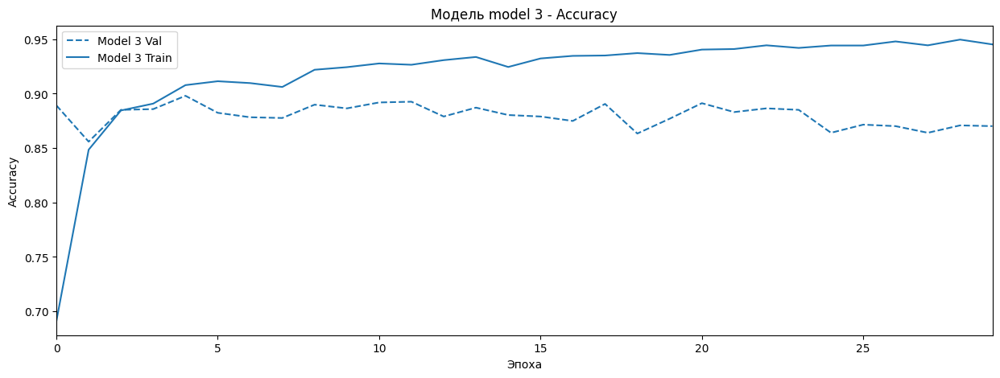

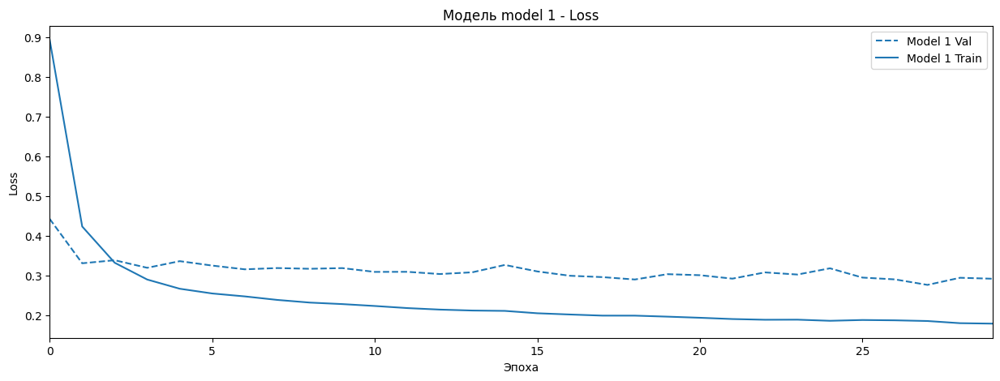

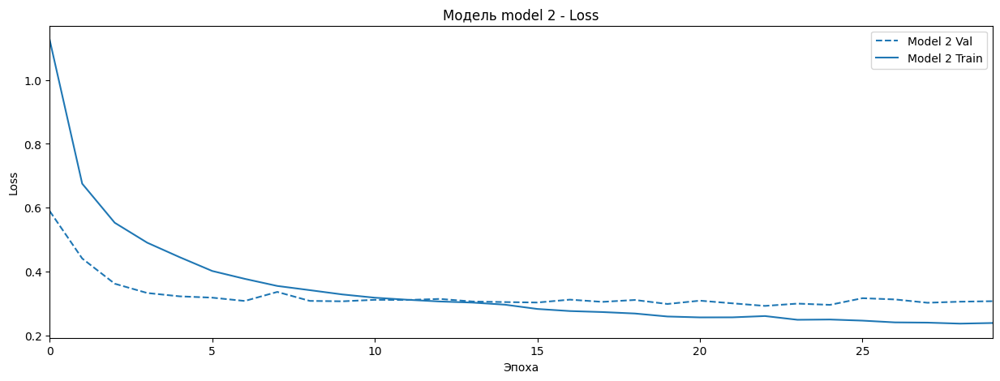

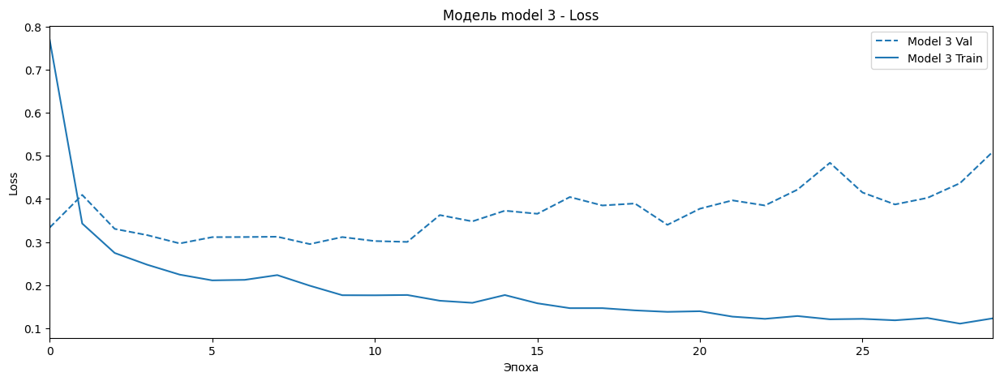

In [ ]:
plot_history(history_1, 'model 1', key='accuracy')
plot_history(history_2, 'model 2', key='accuracy')
plot_history(history_3, 'model 3', key='accuracy')

# Построение графика потерь для каждой модели
plot_history(history_1, 'model 1', key='loss')
plot_history(history_2, 'model 2', key='loss')
plot_history(history_3, 'model 3', key='loss')

In [ ]:
!pip install keras-tuner --upgrade

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 4.2 MB/s eta 0:00:00


In [ ]:
from kerastuner import RandomSearch
from kerastuner.engine.hyperparameters import HyperParameters
import tensorflow as tf
from tensorflow.keras import Sequential
from keras.layers import Dense, Dropout
from keras.optimizers import Adam

<ipython-input-21-b0a47e0e0420>:1: DeprecationWarning: `import kerastuner` is deprecated, please use `import keras_tuner`.
  from kerastuner import RandomSearch


In [ ]:
# Функция создания модели с гиперпараметрами
def build_model(hp):
    model = Sequential()
    model.add(Dense(hp.Int('input_units', min_value=32, max_value=256, step=32),
                    input_shape=(X_train.shape[1],), activation='relu'))
    model.add(Dropout(hp.Float('dropout_1', min_value=0.0, max_value=0.5, default=0.25, step=0.05)))
    model.add(Dense(hp.Int('dense_1_units', min_value=32, max_value=256, step=32), activation='relu'))
    model.add(Dropout(hp.Float('dropout_2', min_value=0.0, max_value=0.5, default=0.25, step=0.05)))
    model.add(Dense(y_train_categorical.shape[1], activation='softmax'))

    model.compile(optimizer=Adam(hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    return model

# Создание объекта RandomSearch
tuner = RandomSearch(
    build_model,
    objective='val_accuracy',
    max_trials=5,  # Количество вариантов гиперпараметров для пробы
    executions_per_trial=3,  # Количество повторений каждого эксперимента
    directory='my_dir',  # Директория для сохранения логов
    project_name='hparam_tuning'
)



In [ ]:
# Запуск поиска
tuner.search(X_train, y_train_categorical,
             epochs=10,
             batch_size=64,
             validation_split=0.2)

# Получение наилучших гиперпараметров
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

Trial 5 Complete [00h 00m 25s]
val_accuracy: 0.8991615573565165

Best val_accuracy So Far: 0.905733068784078
Total elapsed time: 00h 02m 40s


In [ ]:
# Загрузка лучшей модели
best_model = tuner.get_best_models(num_models=1)[0]

In [ ]:
# Получение значений гиперпараметров с проверкой на их наличие
epochs = best_hps.get('epochs') if 'epochs' in best_hps.values else 40
batch_size = best_hps.get('batch_size') if 'batch_size' in best_hps.values else 64

# Обучение модели с лучшими гиперпараметрами
history = best_model.fit(X_train, y_train_categorical,
                         epochs=epochs,
                         batch_size=batch_size,
                         validation_split=0.2)




Epoch 1/40
92/92 [==============================] - 2s 10ms/step - loss: 0.5372 - accuracy: 0.7856 - val_loss: 0.4287 - val_accuracy: 0.8973
Epoch 2/40
92/92 [==============================] - 1s 7ms/step - loss: 0.5205 - accuracy: 0.7905 - val_loss: 0.4065 - val_accuracy: 0.9021
Epoch 3/40
92/92 [==============================] - 1s 7ms/step - loss: 0.4935 - accuracy: 0.7960 - val_loss: 0.3891 - val_accuracy: 0.9103
Epoch 4/40
92/92 [==============================] - 1s 7ms/step - loss: 0.4731 - accuracy: 0.8118 - val_loss: 0.3753 - val_accuracy: 0.9028
Epoch 5/40
92/92 [==============================] - 1s 7ms/step - loss: 0.4657 - accuracy: 0.8107 - val_loss: 0.3644 - val_accuracy: 0.9075
Epoch 6/40
92/92 [==============================] - 1s 8ms/step - loss: 0.4498 - accuracy: 0.8158 - val_loss: 0.3563 - val_accuracy: 0.8906
Epoch 7/40
92/92 [==============================] - 1s 8ms/step - loss: 0.4428 - accuracy: 0.8206 - val_loss: 0.3476 - val_accuracy: 0.9048
Epoch 8/40
92/92 [=

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

# Оценка модели на тестовых данных
test_loss, test_accuracy = best_model.evaluate(X_test, y_test_categorical)
print(f"Тестовая потеря: {test_loss}")
print(f"Тестовая точность: {test_accuracy}")


93/93 [==============================] - 0s 2ms/step - loss: 0.4183 - accuracy: 0.8351
Тестовая потеря: 0.41826650500297546
Тестовая точность: 0.8350865244865417


In [ ]:
# Предсказания на тестовых данных
y_pred = best_model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test_categorical, axis=1)


93/93 [==============================] - 0s 2ms/step


In [ ]:

# Вывод отчета о классификации
print(classification_report(y_true, y_pred_classes))

              precision    recall  f1-score   support

           0       1.00      0.99      1.00       537
           1       0.86      0.75      0.80       491
           2       0.79      0.89      0.84       532
           3       0.80      0.86      0.83       496
           4       0.81      0.75      0.78       420
           5       0.74      0.73      0.73       471

    accuracy                           0.84      2947
   macro avg       0.83      0.83      0.83      2947
weighted avg       0.84      0.84      0.83      2947



In [ ]:
# Вывод матрицы ошибок
print(confusion_matrix(y_true, y_pred_classes))

[[533   0   4   0   0   0]
 [  0 369 119   0   0   3]
 [  0  60 471   0   0   1]
 [  0   0   0 427  34  35]
 [  0   0   0  19 316  85]
 [  0   0   0  86  40 345]]


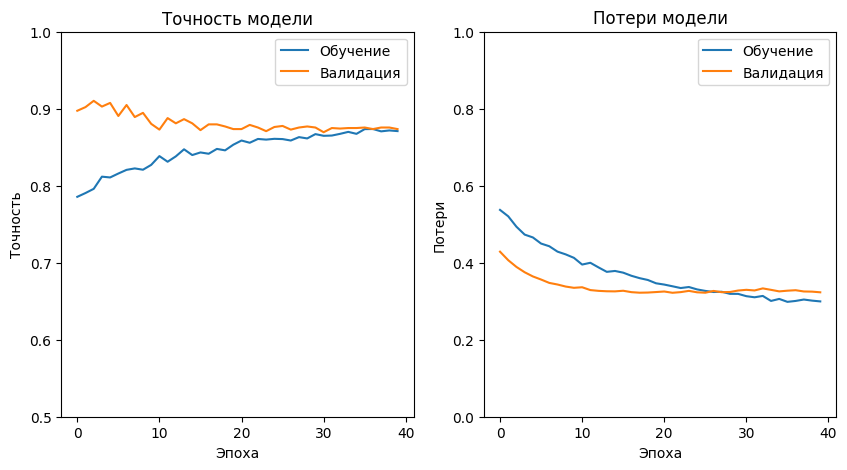

In [ ]:
# Установка размера фигуры для более детального просмотра
plt.figure(figsize=(10, 5))

# Построение графика точности
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Обучение')
plt.plot(history.history['val_accuracy'], label='Валидация')
plt.title('Точность модели')
plt.xlabel('Эпоха')
plt.ylabel('Точность')
plt.legend()

# Установка пределов для оси Y, чтобы увидеть более мелкие изменения
plt.ylim(0.5, 1)  # Например, если вы хотите видеть изменения от 50% до 100%

# Построение графика потерь
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Обучение')
plt.plot(history.history['val_loss'], label='Валидация')
plt.title('Потери модели')
plt.xlabel('Эпоха')
plt.ylabel('Потери')
plt.legend()

# Установка пределов для оси Y, чтобы увидеть более мелкие изменения
plt.ylim(0, 1)  # Например, если вы хотите видеть изменения от 0 до 1

plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Предсказание классов для тестового набора данных
y_pred = best_model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)

# Вывод реальных и предсказанных классов
for i in range(70, 90):
    print(f'Пример {i+1}: Реальный класс - {y_true[i]}, Предсказанный класс - {y_pred_classes[i]}')


93/93 [==============================] - 0s 3ms/step
Пример 71: Реальный класс - 0, Предсказанный класс - 0
Пример 72: Реальный класс - 0, Предсказанный класс - 0
Пример 73: Реальный класс - 0, Предсказанный класс - 0
Пример 74: Реальный класс - 0, Предсказанный класс - 0
Пример 75: Реальный класс - 0, Предсказанный класс - 0
Пример 76: Реальный класс - 0, Предсказанный класс - 0
Пример 77: Реальный класс - 0, Предсказанный класс - 0
Пример 78: Реальный класс - 0, Предсказанный класс - 0
Пример 79: Реальный класс - 0, Предсказанный класс - 0
Пример 80: Реальный класс - 3, Предсказанный класс - 3
Пример 81: Реальный класс - 3, Предсказанный класс - 3
Пример 82: Реальный класс - 3, Предсказанный класс - 3
Пример 83: Реальный класс - 3, Предсказанный класс - 3
Пример 84: Реальный класс - 3, Предсказанный класс - 3
Пример 85: Реальный класс - 3, Предсказанный класс - 3
Пример 86: Реальный класс - 3, Предсказанный класс - 3
Пример 87: Реальный класс - 3, Предсказанный класс - 3
Пример 88: Р

93/93 [==============================] - 0s 4ms/step


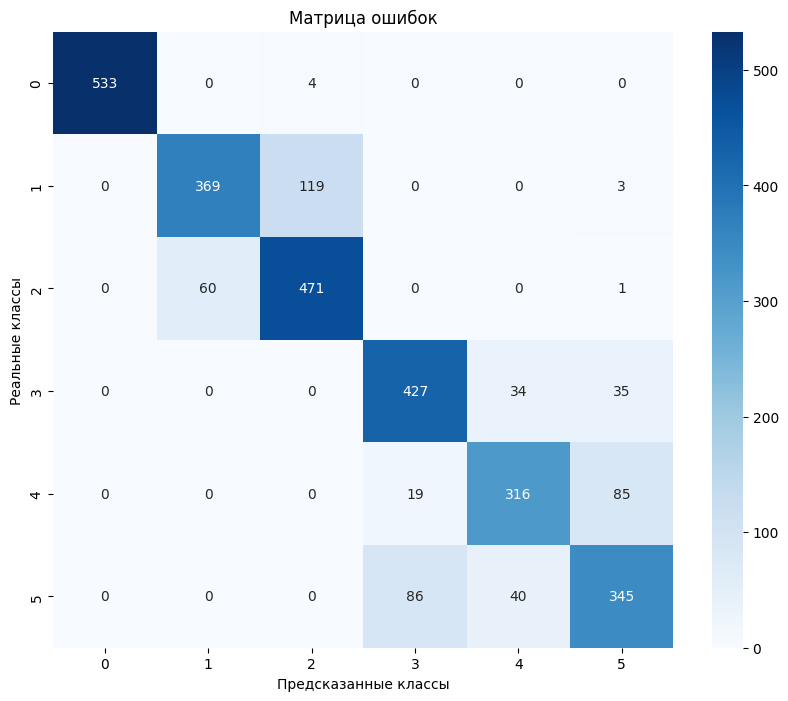

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Предсказания на тестовых данных
y_pred = best_model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test_categorical, axis=1)

# Визуализация матрицы ошибок
plt.figure(figsize=(10, 8))
cm = confusion_matrix(y_true, y_pred_classes)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Матрица ошибок')
plt.xlabel('Предсказанные классы')
plt.ylabel('Реальные классы')
plt.show()


plt.show()




# 3) AutoKeras


3) Возьмите датасет или изображений, или видео, или текстов, или звуковых/речевых данных, которые связаны с вашим проектом и нужны для решения задач проекта или создания нового умного функционала продукта/сервиса проекта.

Проведите обработку взятых данных с помощью нейронных сетей (аналогично предыдущим пунктам).

Выполните п.3, используя AutoKeras.

*Если ваш проект связан с рекомендательными системами или обучением с подкреплением, то можно адаптировать/изменить п.3 для решения такой задачи.

In [ ]:
import os
import numpy as np
import pandas as pd
import tensorflow as tf

from tensorflow import io
from tensorflow import data as tfd
from tensorflow import image as tfi
from tensorflow.keras.preprocessing.image import ImageDataGenerator

import plotly.express as px
import matplotlib.pyplot as plt

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
train_path = "/content/drive/MyDrive/landscape/Training Data/"
test_path = "/content/drive/MyDrive/landscape/Testing Data/"
valid_path = "/content/drive/MyDrive/landscape/Validation Data/"

In [ ]:
# Class Names
class_names = sorted(os.listdir(train_path))
n_classes = len(class_names)

# Show
print(f"Number of Classes : {n_classes}\nClass names : {class_names}")

Number of Classes : 5
Class names : ['Coast', 'Desert', 'Forest', 'Glacier', 'Mountain']


In [ ]:
# Class Distribution
class_dis = [len(os.listdir(train_path + name)) for name in class_names]


# Visualize
fig = px.pie(names=class_names, values=class_dis, title="Training Class Distribution", hole=0.4)
fig.update_layout({'title':{'x':0.5}})
fig.show()

fig = px.bar(x=class_names, y=class_dis, color=class_names)
fig.show()

In [ ]:
# Class Distribution
class_dis = [len(os.listdir(valid_path + name)) for name in class_names]


# Visualize
fig = px.pie(names=class_names, values=class_dis, title="Validation Class Distribution", hole=0.4)
fig.update_layout({'title':{'x':0.5}})
fig.show()

fig = px.bar(x=class_names, y=class_dis, color=class_names)
fig.show()

In [ ]:
# Class Distribution
class_dis = [len(os.listdir(test_path + name)) for name in class_names]


# Visualize
fig = px.pie(names=class_names, values=class_dis, title="Testing Class Distribution", hole=0.4)
fig.update_layout({'title':{'x':0.5}})
fig.show()

fig = px.bar(x=class_names, y=class_dis, color=class_names)
fig.show()

In [ ]:
# List all TFRecords Paths
tfr_train = "/content/drive/MyDrive/landscape/TFrecords/Train/"
tfr_valid = "/content/drive/MyDrive/landscape/TFrecords/Valid/"
tfr_test = "/content/drive/MyDrive/landscape/TFrecords/Test/"

In [ ]:
print(f"Train TFRecords : {len(os.listdir(tfr_train))} = {len(os.listdir(tfr_train))//5} X 5")
print(f"Valid TFRecords : {len(os.listdir(tfr_valid))} = {len(os.listdir(tfr_valid))//5} X 5")
print(f"Test TFRecords : {len(os.listdir(tfr_test))} = {len(os.listdir(tfr_test))//5} X 5")

Train TFRecords : 10000 = 2000 X 5
Valid TFRecords : 1500 = 300 X 5
Test TFRecords : 500 = 100 X 5


In [ ]:
def decode_image(image):
    image = tfi.decode_jpeg(image, channels=3)
#     image = tfi.resize(image, (256,256))
    # Apply any augmentations here.
    image = tf.cast(image, tf.float32)
    image = image/255.
    return image

def decode_data(example):
    features = {
        'image':io.FixedLenFeature([], tf.string),
        'label':io.FixedLenFeature([], tf.int64)
    }

    example = io.parse_single_example(example, features)
    image, label = example['image'], example['label']
    image = decode_image(image)
    return image, label

def load_data(file_dir, BATCH_SIZE=32, BUFFER=1000):
    AUTOTUNE = tfd.AUTOTUNE
    file_dir = file_dir + "*.tfrecord"
    files = tfd.Dataset.list_files(file_dir)
    data = tfd.TFRecordDataset(files, num_parallel_reads=AUTOTUNE)
    data = data.map(decode_data, num_parallel_calls=AUTOTUNE)
    data = data.shuffle(BUFFER).batch(BATCH_SIZE, drop_remainder=True)
    data = data.prefetch(AUTOTUNE)
    return data

train_ds = load_data(file_dir=tfr_train)
valid_ds = load_data(file_dir=tfr_valid)
test_ds = load_data(file_dir=tfr_test, BATCH_SIZE=1, BUFFER=500)

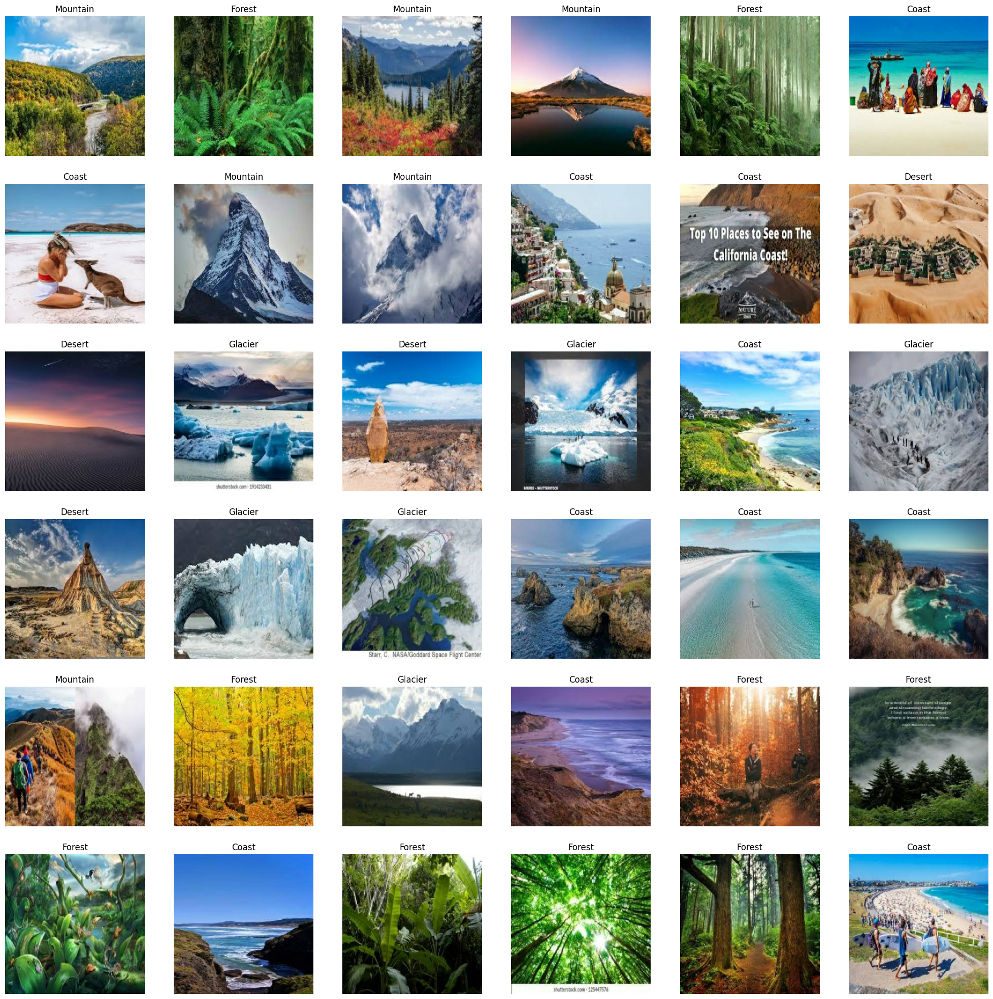

In [ ]:
def show_images(data, class_names=class_names, model=None, SIZE=(25,25), GRID=[6,6]):

    # Plot Configuration
    n_rows, n_cols = GRID
    n_images = n_rows * n_cols
    plt.figure(figsize=SIZE)

    # Iterate through the data
    i=1
    for images, labels in iter(data):

        # Select some items randomly
        id = np.random.randint(len(images))
        image, label = tf.expand_dims(images[id], axis=0), class_names[int(labels[id])]

        # Make Prediction
        if model is not None:
            pred = model.predict(image)[0]
            score = np.round(max(pred),2)
            pred_class = class_names[np.argmax(pred)]

            title = f"True : {label}\nPred : {pred_class}\n Score : {score}"
        else:
            title = label

        # plot Images
        plt.subplot(n_rows, n_cols, i)
        plt.imshow(image[0])
        plt.axis('off')
        plt.title(title)

        # Break Loop
        i+=1
        if i>n_images:
            break

    # Final Show
    plt.show()
show_images(train_ds)

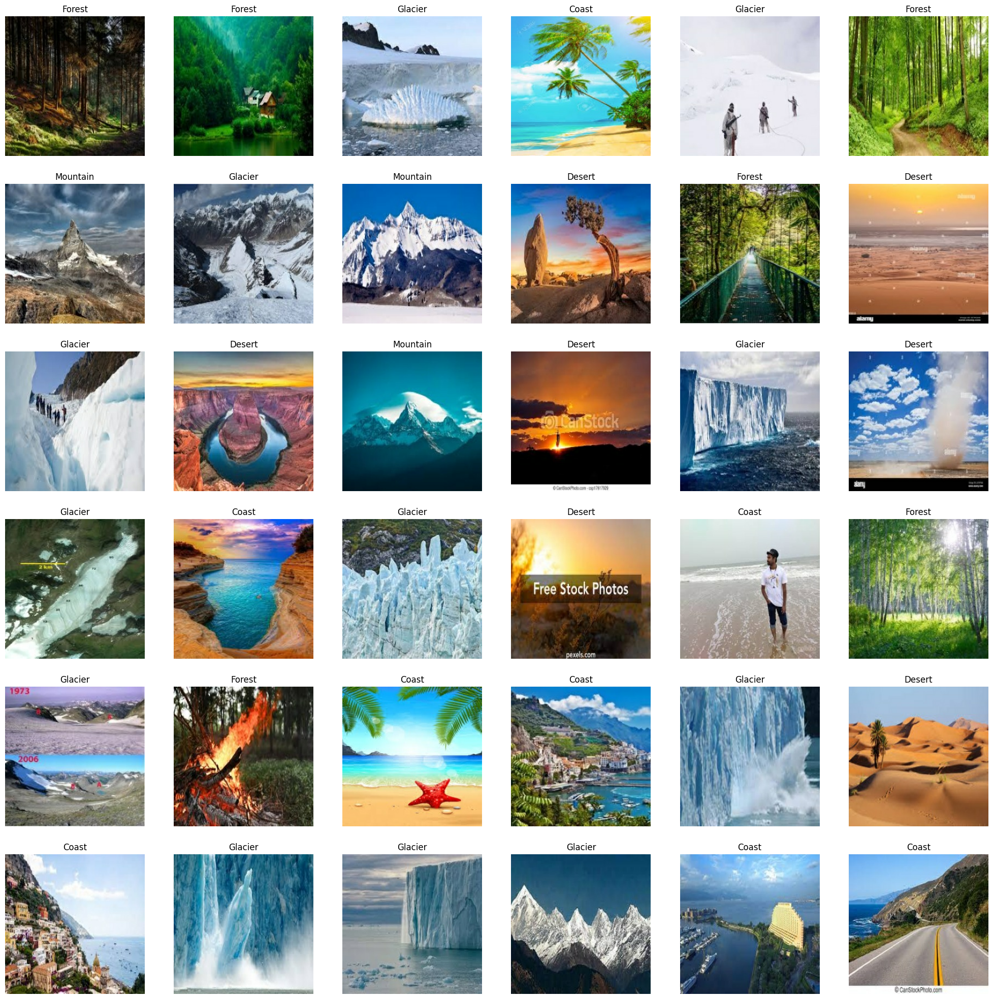

In [ ]:
show_images(valid_ds)

Model Architecture

In [ ]:
pip install autokeras

  Using cached keras-3.3.3-py3-none-any.whl (1.1 MB)
  Using cached tensorflow-2.16.1-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (589.8 MB)
  Using cached tensorboard-2.16.2-py3-none-any.whl (5.5 MB)
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.15.2
    Uninstalling tensorboard-2.15.2:
      Successfully uninstalled tensorboard-2.15.2
  Attempting uninstall: keras
    Found existing installation: keras 2.15.0
    Uninstalling keras-2.15.0:
      Successfully uninstalled keras-2.15.0
  Attempting uninstall: tensorflow
    Found existing installation: tensorflow 2.15.1
    Uninstalling tensorflow-2.15.1:
      Successfully uninstalled tensorflow-2.15.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tf-keras 2.15.1 requires tensorflow<2.16,>=2.15, but you have tensorflow 2.16.1 which is incompatible.


In [ ]:
pip install tensorflow-hub

  Using cached tensorflow-2.15.1-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (475.2 MB)
  Using cached tensorboard-2.15.2-py3-none-any.whl (5.5 MB)
  Using cached keras-2.15.0-py3-none-any.whl (1.7 MB)
  Attempting uninstall: keras
    Found existing installation: keras 3.3.3
    Uninstalling keras-3.3.3:
      Successfully uninstalled keras-3.3.3
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.16.2
    Uninstalling tensorboard-2.16.2:
      Successfully uninstalled tensorboard-2.16.2
  Attempting uninstall: tensorflow
    Found existing installation: tensorflow 2.16.1
    Uninstalling tensorflow-2.16.1:
      Successfully uninstalled tensorflow-2.16.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
autokeras 2.0.0 requires keras>=3.0.0, but you have keras 2.15.0 which is incompatible.
tensorflow-text 2.16.1 req

In [ ]:
import tensorflow_hub as hub
from keras.models import load_model

In [ ]:
import autokeras as ak
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder, normalize
from sklearn.model_selection import train_test_split
from tensorflow.keras import utils
import matplotlib.pyplot as plt
from PIL import Image
import os

In [ ]:
# Папка с папками картинок, рассортированных по категориям
IMAGE_PATH = '/content/drive/MyDrive/landscape/Training Data/'
# Получение списка папок, находящемуся по адресу в скобках
os.listdir(IMAGE_PATH)

In [ ]:
# просмотр примеров изображений из разных классов
categories = os.listdir(IMAGE_PATH)

plt.figure(figsize=(6,12))

for i, category in enumerate(categories):
  # все имена файлов из папки
  file_names = os.listdir(os.path.join(IMAGE_PATH, category))

  # открываем первое изображение
  img_path = os.path.join(IMAGE_PATH, category, file_names[0])
  img = Image.open(img_path)

  # отображаем содержимое файла
  plt.subplot(4,2,i+1)
  plt.title(category)
  plt.imshow(img)

plt.tight_layout()
plt.show()

In [ ]:
train_data = ak.image_dataset_from_directory(
    IMAGE_PATH,
    image_size = (192,108),
    seed = 111,
    validation_split = 0.2,
    subset = 'training'
)

test_data = ak.image_dataset_from_directory(
    IMAGE_PATH,
    image_size = (192,108),
    seed = 111,
    validation_split = 0.2,
    subset = 'validation'
)

In [ ]:
clf1 = ak.ImageClassifier(max_trials=5,
                          max_model_size=42545288,
                         loss='categorical_crossentropy',
                         metrics=['accuracy'],
                         tuner='hyperband',
                         objective='val_accuracy')
hist = clf1.fit(train_data, epochs=2, validation_split=0.2)

In [ ]:
bit = hub.KerasLayer("https://tfhub.dev/google/bit/m-r50x1/1")
model_path = '/content/drive/MyDrive/landscape/BiT-LR-91-83.h5'
model = load_model(model_path, custom_objects={"KerasLayer":bit})


In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (32, 2048)                23500352  
                                                                 
 dense (Dense)               (32, 5)                   10245     
                                                                 
Total params: 23510597 (89.69 MB)
Trainable params: 10245 (40.02 KB)
Non-trainable params: 23500352 (89.65 MB)
_________________________________________________________________


In [ ]:
model.evaluate(train_ds)

312/312 [==============================] - 4865s 14s/step - loss: 1.4098 - accuracy: 0.9122


[1.4097508192062378, 0.9121594429016113]

In [ ]:
model.evaluate(valid_ds)

46/46 [==============================] - 767s 14s/step - loss: 3.0030 - accuracy: 0.8417


[3.003037452697754, 0.8417119383811951]

In [ ]:
model.evaluate(test_ds)

500/500 [==============================] - 309s 445ms/step - loss: 1.8340 - accuracy: 0.9140


[1.833951711654663, 0.9139999747276306]

1/1 [==============================] - 0s 383ms/step


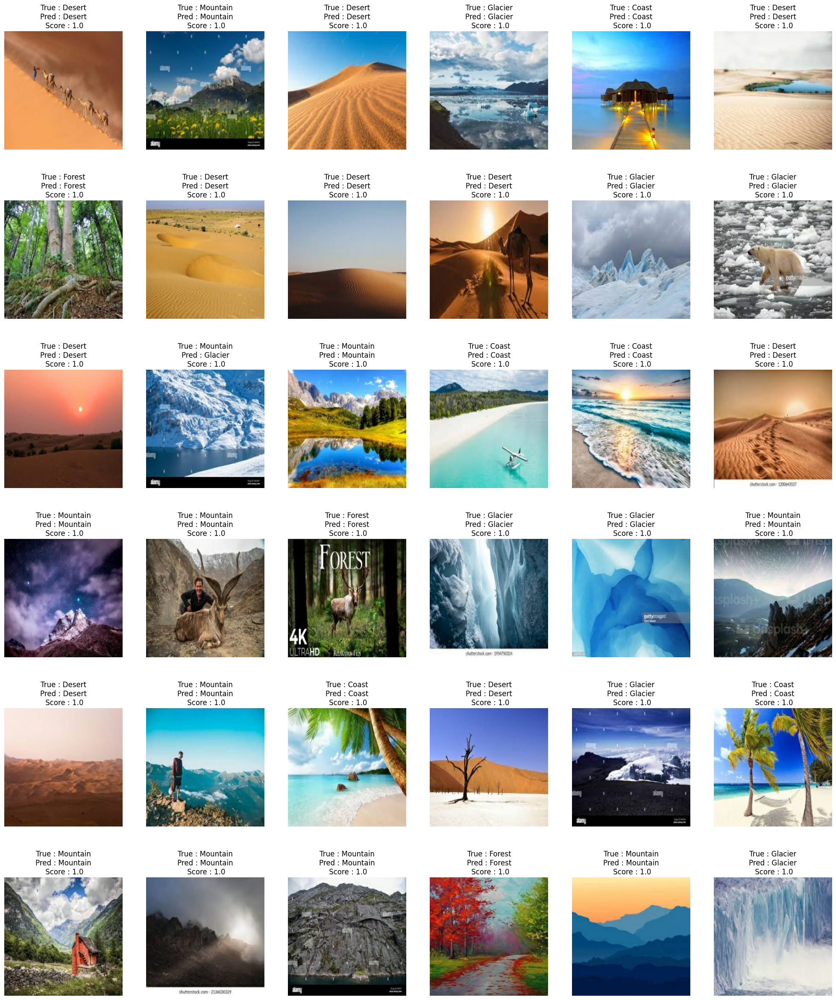

In [ ]:
# Model Predictions
show_images(test_ds, class_names=class_names, model=model, SIZE=(25,30))